In [2]:
#!/usr/bin/env python

# --------------------------------------------------------
# Tensorflow Faster R-CNN
# Licensed under The MIT License [see LICENSE for details]
# Written by Xinlei Chen, based on code from Ross Girshick
# --------------------------------------------------------

"""
Demo script showing detections in sample images.

See README.md for installation instructions before running.
"""
%matplotlib inline
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import _init_paths

from model.config import cfg
from model.test import im_detect
from model.nms_wrapper import nms

from utils.timer import Timer
import matplotlib.pyplot as plt
import numpy as np
import os, cv2
import argparse

from nets.vgg16 import vgg16
from nets.resnet_v1 import resnetv1
from os import listdir
from os.path import isfile, join
import torch

CLASSES = ('__background__',
           'text')

NETS = {'vgg16': ('vgg16_faster_rcnn_iter_%d.pth',),'res101': ('res101_faster_rcnn_iter_%d.pth',)}
DATASETS= {'pascal_voc': ('voc_2007_trainval',),'pascal_voc_0712': ('voc_2007_trainval+voc_2012_trainval',)}

torch.cuda.set_device(2)


In [3]:
def vis_detections(im, class_name, dets, thresh=0.5):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return

    im = im[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')

    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  thresh),
                  fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()


In [4]:
def demo(net, image_name):
    """Detect object classes in an image using pre-computed object proposals."""

    # Load the demo image
    #im_file = os.path.join(cfg.DATA_DIR, 'demo', image_name)
    im_file = os.path.join(cfg.DATA_DIR, 'VOCdevkit2007', 'VOC2007', 'ImageSets', 'Main', image_name)
    im = cv2.imread(im_file)
    print('Demo for {}'.format(im_file))


    # Detect all object classes and regress object bounds
    timer = Timer()
    timer.tic()
    scores, boxes = im_detect(net, im)
    timer.toc()
    print('Detection took {:.3f}s for {:d} object proposals'.format(timer.total_time(), boxes.shape[0]))

    # Visualize detections for each class
    CONF_THRESH = 0.7
    NMS_THRESH = 0.3
    for cls_ind, cls in enumerate(CLASSES[1:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)]
        cls_scores = scores[:, cls_ind]
        dets = np.hstack((cls_boxes,
                          cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(torch.from_numpy(dets), NMS_THRESH)
        dets = dets[keep.numpy(), :]
        vis_detections(im, cls, dets, thresh=CONF_THRESH)

In [5]:
demonet = 'vgg16' # Network to use [vgg16 res101]
dataset = 'pascal_voc' # Trained dataset [pascal_voc pascal_voc_0712]

In [6]:
#torch.cuda.set_device(0)
if True:
    cfg.TEST.HAS_RPN = True  # Use RPN for proposals

    # model path
    #saved_model = os.path.join('../output', demonet, DATASETS[dataset][0], 'default',
    #                          NETS[demonet][0] %(70000 if dataset == 'pascal_voc' else 110000))
    #saved_model = '../output.back/vgg16/custom_2018_trainval_diff/default/vgg16_faster_rcnn_iter_4000.pth'
    #'''
    saved_model = '../output/vgg16/custom_2018_trainval/default/vgg16_faster_rcnn_iter_10000.pth' # 4-class{back, tit, xla, yla}
    CLASSES = ('__background__', 'text')
    '''
    saved_model = '../../project2018/test1/vgg16_faster_rcnn_iter_40000.pth' # 3-class{back, text, ylabel}
    CLASSES = ('__background__', 'text', 'ylabel')
    '''

    if not os.path.isfile(saved_model):
        raise IOError(('{:s} not found.\nDid you download the proper networks from '
                       'our server and place them properly?').format(saved_model))

    # load network
    if demonet == 'vgg16':
        net = vgg16()
    elif demonet == 'res101':
        net = resnetv1(num_layers=101)
    else:
        raise NotImplementedError
    '''
    net.create_architecture(len(CLASSES),
                            tag='default', anchor_scales=[8, 16, 32])
    #net.load_state_dict(torch.load(saved_model, map_location=lambda storage, loc: storage))
    net.load_state_dict(torch.load(saved_model))
    print(net)
    '''

In [7]:
net.create_architecture(len(CLASSES),tag='default', anchor_scales=[8, 16, 32])
state_dict = torch.load('../output/vgg16/custom_2018_trainval/default/vgg16_faster_rcnn_iter_10000.pth')

from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():    
    name = k.replace('module.','') #[7:] # remove `module.`
    #print(name)
    new_state_dict[name] = v
net.load_state_dict(new_state_dict)

number of anchors =  9
/izola/xyl/pytorch-faster-rcnn/tools/../lib/nets/network.py


In [8]:
def vis_detections1(ax, im, class_name, dets, thresh=0.5):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return


    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')
    '''
    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  thresh),   fontsize=14)    
    '''
    
    
    '''
    plt.axis('off')
    plt.tight_layout()
    plt.draw()
    '''


In [9]:
def demo1(net, image_name, CONF_THRESH = 0.7):
    """Detect object classes in an image using pre-computed object proposals."""

    # Load the demo image
    #im_file = os.path.join(cfg.DATA_DIR, 'demo', image_name)
    #im_file = os.path.join(cfg.DATA_DIR, 'VOCdevkit2007', 'VOC2007', 'JPEGImages', image_name)
    
    #im_file = '/home/xliu/checkImageFromGoogle/bs1.png'
    
    #im_file = '/home/xliu/pytorch-faster-rcnn/KNOWLEDGE_FROM_CHARTS/SEMICON_BARS/semi_equipment_materials.jpg'
    im_file = image_name
    im = cv2.imread(im_file)
    print('Demo for {}'.format(im_file))


    # Detect all object classes and regress object bounds
    timer = Timer()
    timer.tic()
    scores, boxes = im_detect(net, im)
    timer.toc()
    print('Detection took {:.3f}s for {:d} object proposals'.format(timer.total_time(), boxes.shape[0]))

    # Visualize detections for each class
    im = im[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    NMS_THRESH = 0.3
    for cls_ind, cls in enumerate(CLASSES[1:]):
    #for cls_ind, cls in enumerate(CLASSES[0:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)]
        cls_scores = scores[:, cls_ind]
        dets = np.hstack((cls_boxes,
                          cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(torch.from_numpy(dets), NMS_THRESH)
        dets = dets[keep.numpy(), :]

        vis_detections1(ax, im, cls, dets, thresh=CONF_THRESH)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [10]:
for cls_ind, cls in enumerate(CLASSES[0:]):
    print(cls_ind, cls)

0 __background__
1 text


In [11]:
for param in net.parameters():
    param.requires_grad = False

In [12]:
net = net.cuda()
net = net.eval()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/05_02.jpg
torch.Size([1, 512, 37, 54])
torch.Size([1, 3, 600, 871])


/izola/xyl/pytorch-faster-rcnn/tools/../lib/nets/network.py:331: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  rpn_cls_prob_reshape = F.softmax(rpn_cls_score_reshape)
/izola/xyl/pytorch-faster-rcnn/tools/../lib/nets/network.py:368: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  cls_prob = F.softmax(cls_score)


torch.Size([300, 3, 74, 74])
Detection took 0.632s for 300 object proposals


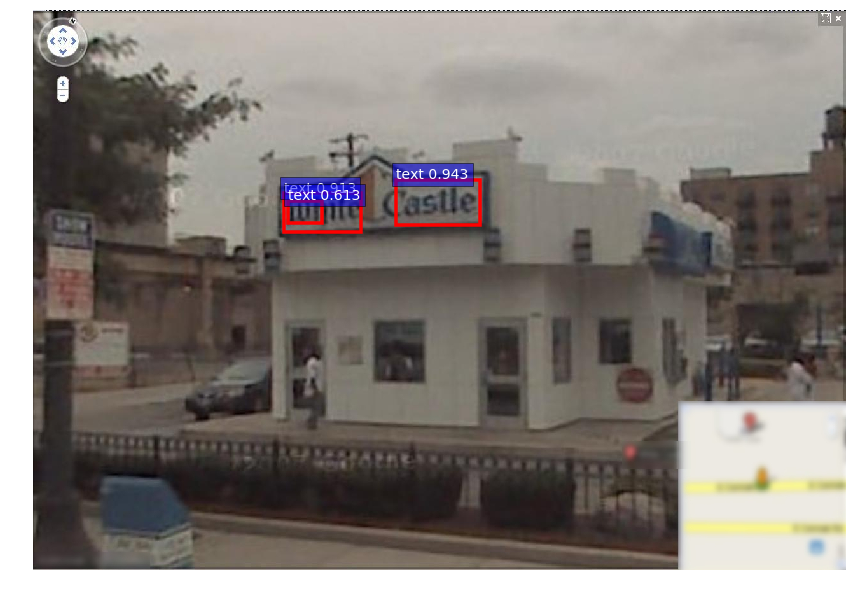

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/01_01.jpg
torch.Size([1, 512, 37, 60])
torch.Size([1, 3, 600, 960])
torch.Size([300, 3, 74, 74])
Detection took 0.609s for 300 object proposals


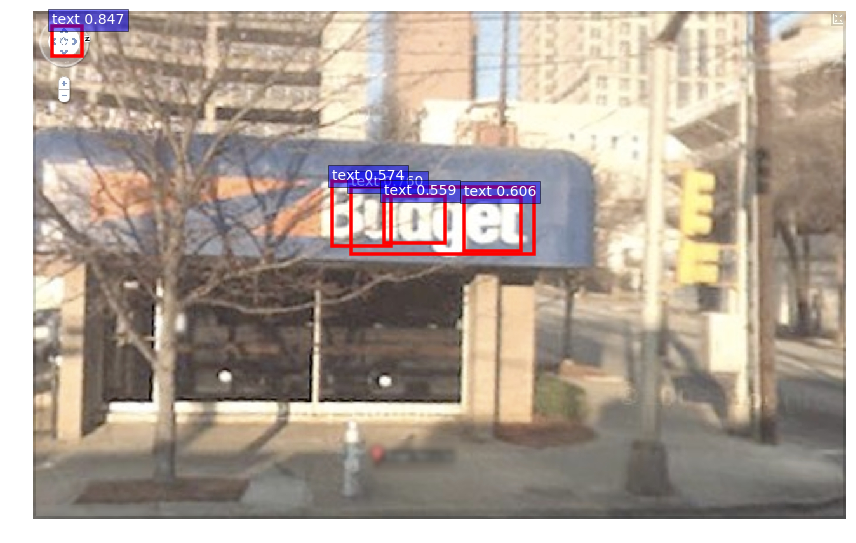

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/05_03.jpg
torch.Size([1, 512, 37, 54])
torch.Size([1, 3, 600, 877])
torch.Size([300, 3, 74, 74])
Detection took 0.601s for 300 object proposals


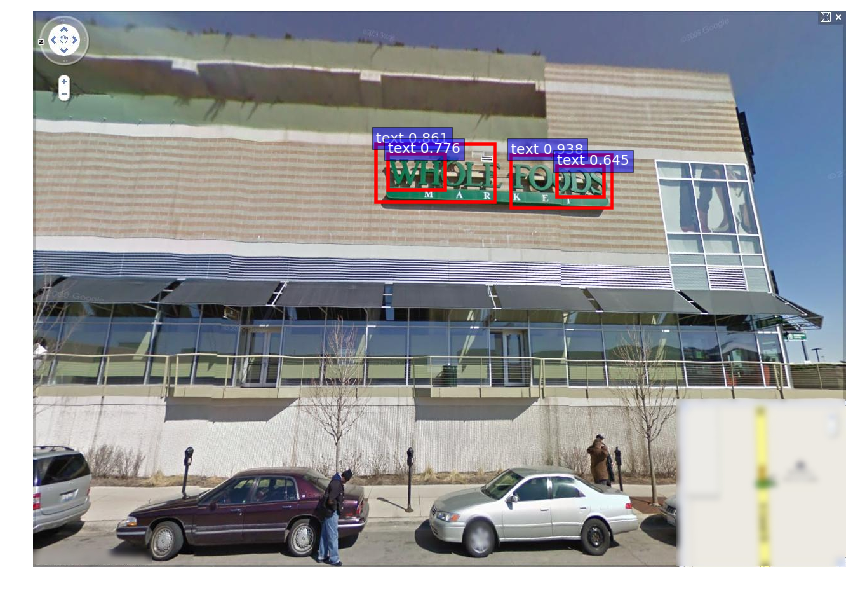

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/01_02.jpg
torch.Size([1, 512, 37, 60])
torch.Size([1, 3, 600, 960])
torch.Size([243, 3, 74, 74])
Detection took 0.512s for 243 object proposals


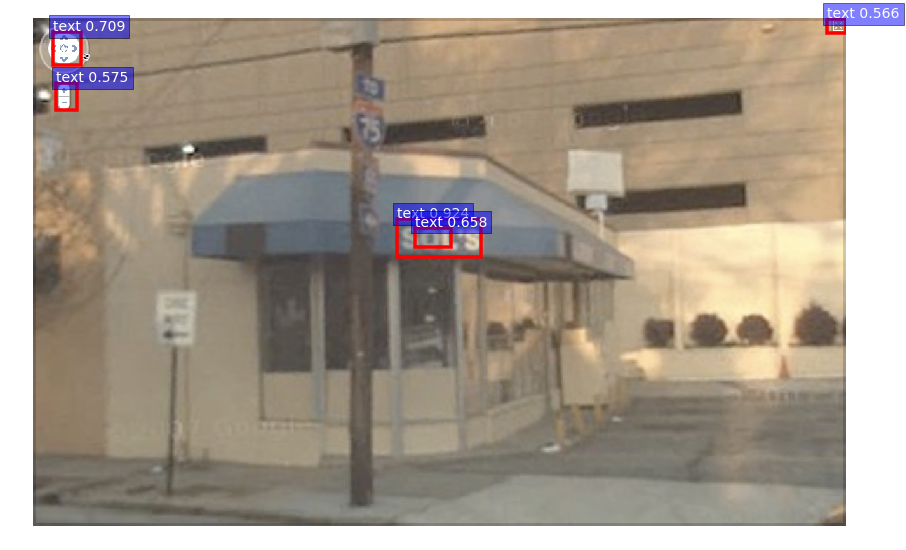

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/05_04.jpg
torch.Size([1, 512, 37, 54])
torch.Size([1, 3, 600, 873])
torch.Size([300, 3, 74, 74])
Detection took 0.596s for 300 object proposals


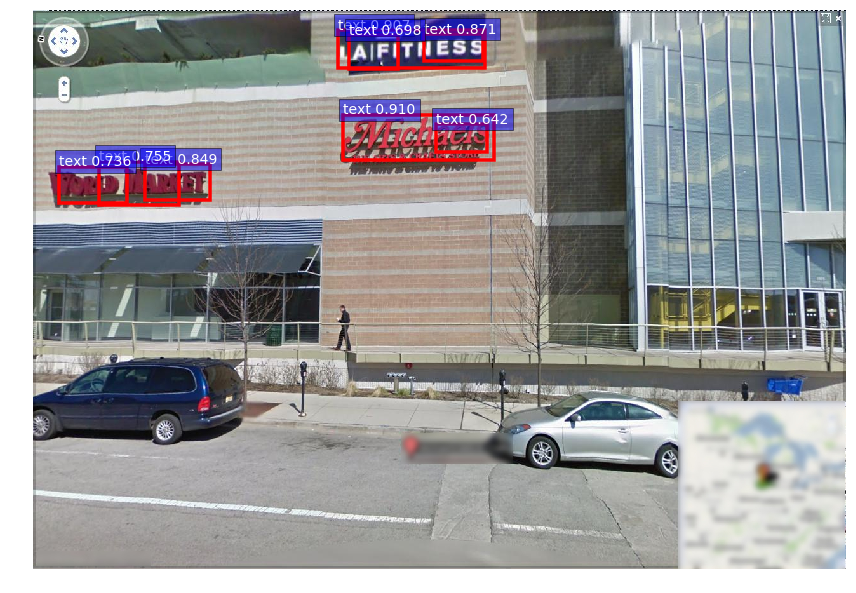

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/01_03.jpg
torch.Size([1, 512, 37, 60])
torch.Size([1, 3, 600, 960])
torch.Size([300, 3, 74, 74])
Detection took 0.607s for 300 object proposals


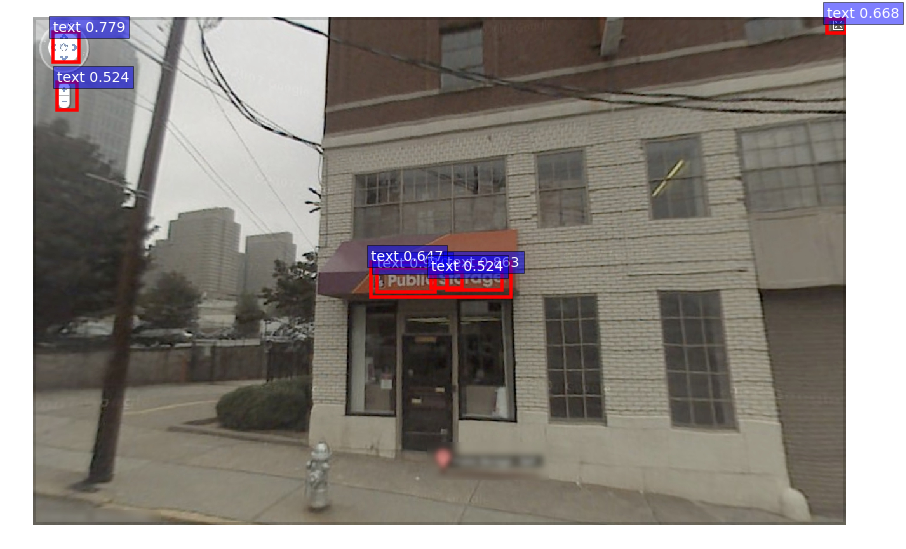

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/05_05.jpg
torch.Size([1, 512, 37, 54])
torch.Size([1, 3, 600, 875])
torch.Size([300, 3, 74, 74])
Detection took 0.600s for 300 object proposals


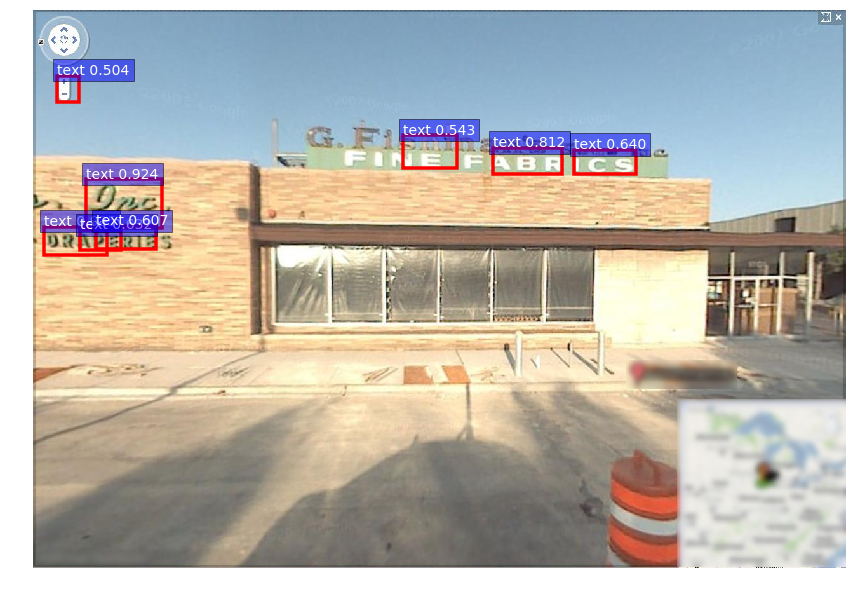

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/01_04.jpg
torch.Size([1, 512, 37, 60])
torch.Size([1, 3, 600, 960])
torch.Size([226, 3, 74, 74])
Detection took 0.488s for 226 object proposals


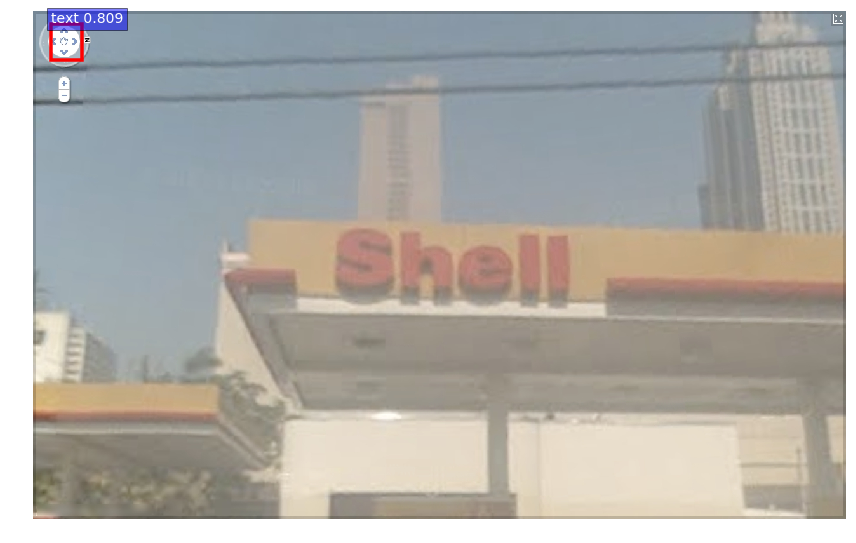

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/05_06.jpg
torch.Size([1, 512, 37, 54])
torch.Size([1, 3, 600, 877])
torch.Size([300, 3, 74, 74])
Detection took 0.605s for 300 object proposals


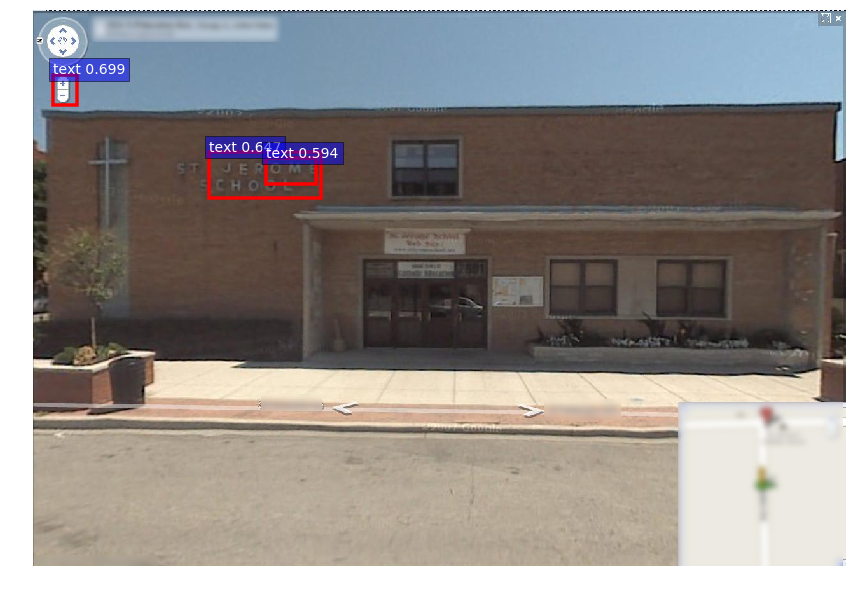

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /home/xliu/SVT_data/img/01_05.jpg
torch.Size([1, 512, 37, 60])
torch.Size([1, 3, 600, 960])
torch.Size([300, 3, 74, 74])
Detection took 0.607s for 300 object proposals


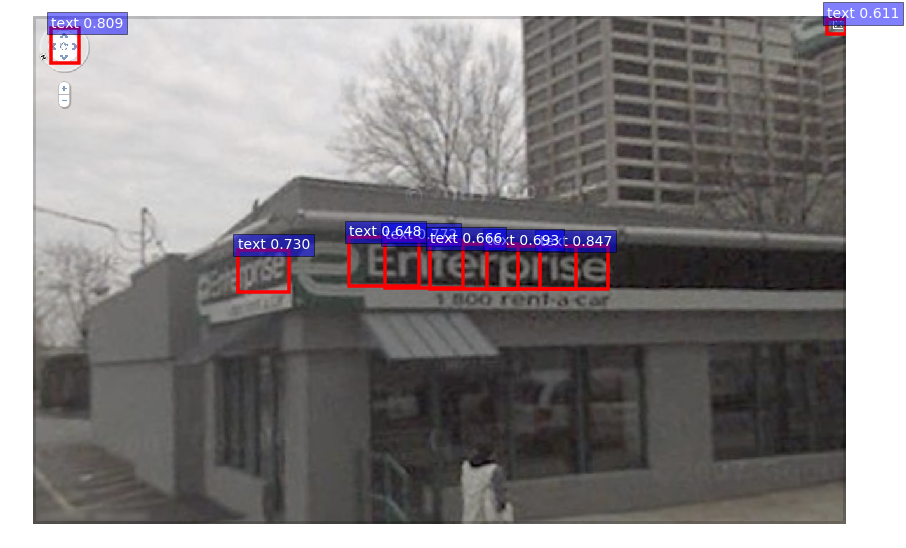

In [19]:
mypath = '/home/xliu/SVT_data/img/'
im_names = [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f))]
#im_names = 
for im_name in im_names[40:50]:
    print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    #print('Demo for data/demo/{}'.format(im_name))
    demo1(net, im_name, CONF_THRESH = 0.5)
    plt.show()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000144.jpg
torch.Size([1, 512, 37, 50])
torch.Size([1, 3, 600, 800])
torch.Size([300, 3, 74, 74])


/izola/xyl/pytorch-faster-rcnn/tools/../lib/nets/network.py:331: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  rpn_cls_prob_reshape = F.softmax(rpn_cls_score_reshape)
/izola/xyl/pytorch-faster-rcnn/tools/../lib/nets/network.py:368: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  cls_prob = F.softmax(cls_score)


Detection took 3.867s for 300 object proposals


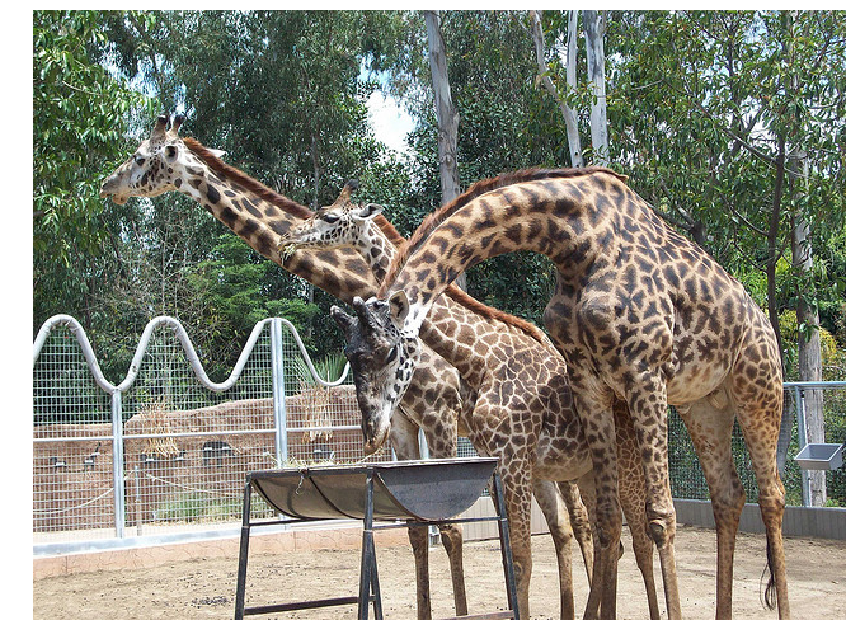

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000149.jpg
torch.Size([1, 512, 37, 56])
torch.Size([1, 3, 600, 897])
torch.Size([172, 3, 74, 74])
Detection took 0.393s for 172 object proposals


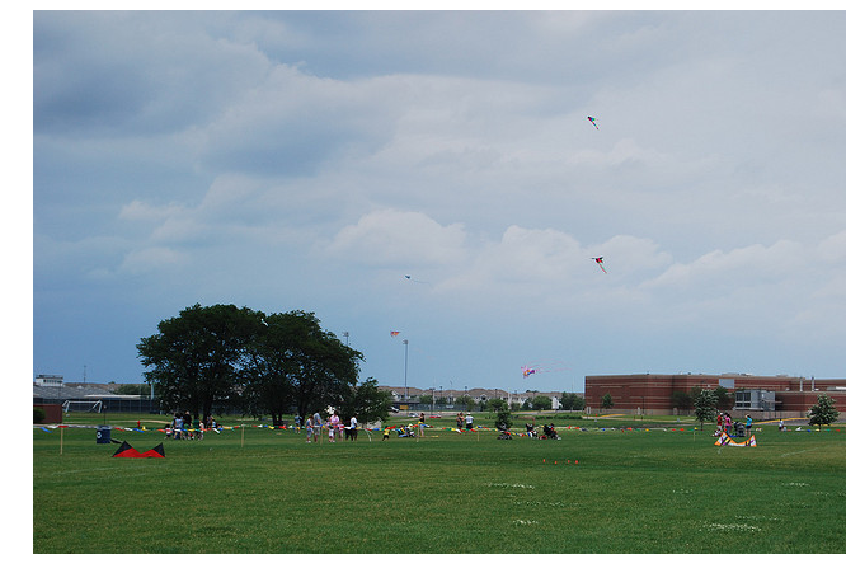

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000151.jpg
torch.Size([1, 512, 50, 37])
torch.Size([1, 3, 800, 600])
torch.Size([300, 3, 74, 74])
Detection took 0.573s for 300 object proposals


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000154.jpg
torch.Size([1, 512, 56, 37])
torch.Size([1, 3, 899, 600])
torch.Size([300, 3, 74, 74])
Detection took 0.585s for 300 object proposals


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000165.jpg
torch.Size([1, 512, 37, 44])
torch.Size([1, 3, 600, 716])
torch.Size([300, 3, 74, 74])
Detection took 0.567s for 300 object proposals


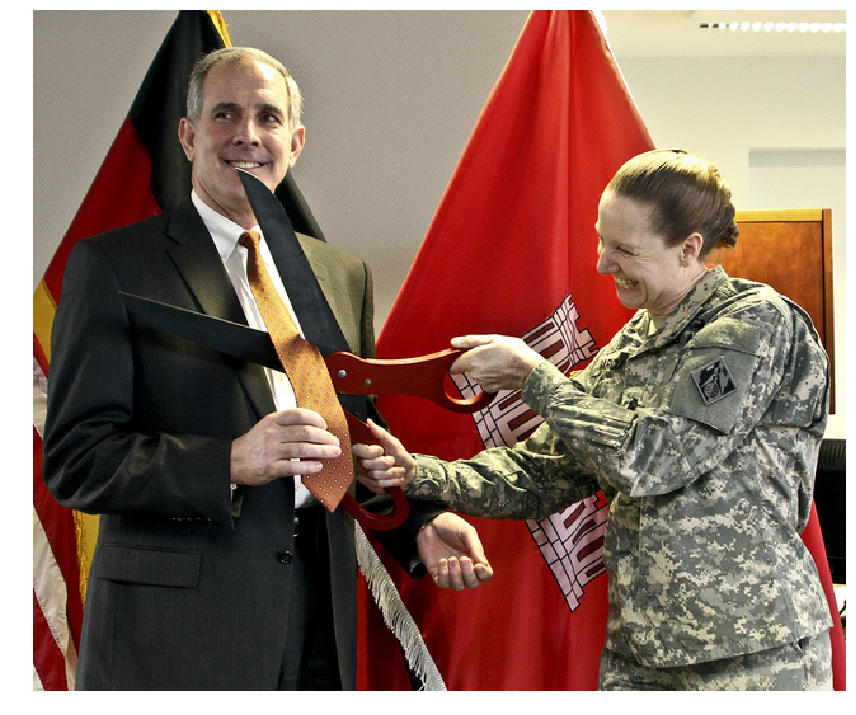

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000194.jpg
torch.Size([1, 512, 37, 50])
torch.Size([1, 3, 600, 800])
torch.Size([300, 3, 74, 74])
Detection took 0.574s for 300 object proposals


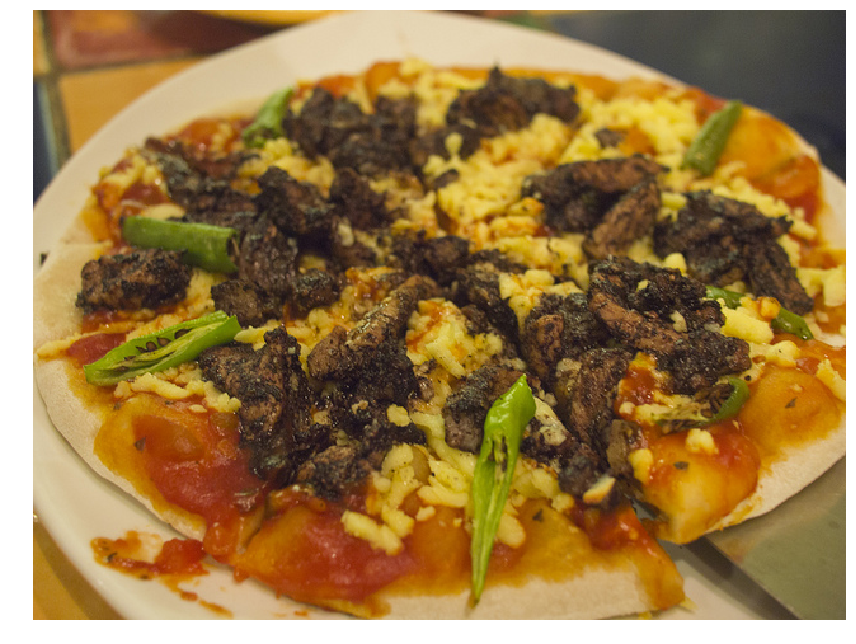

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000201.jpg
torch.Size([1, 512, 37, 56])
torch.Size([1, 3, 600, 897])
torch.Size([300, 3, 74, 74])
Detection took 0.581s for 300 object proposals


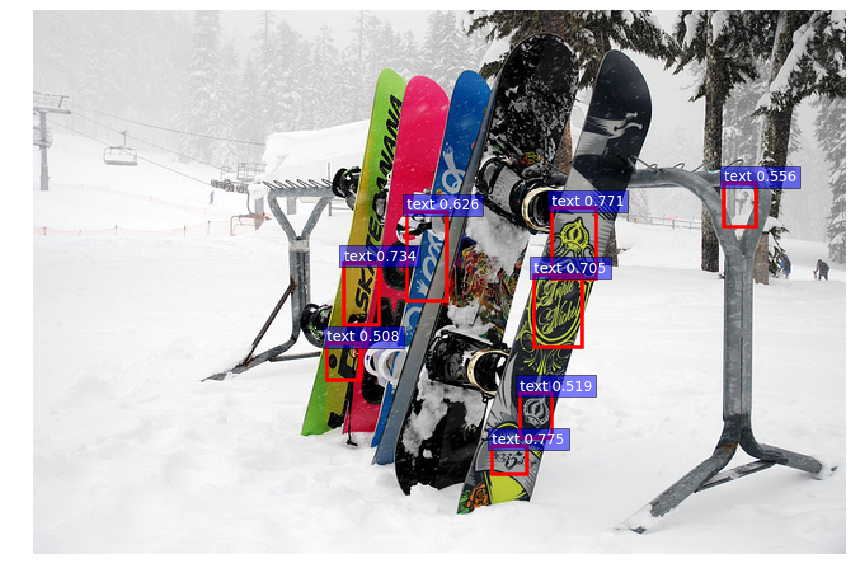

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000247.jpg
torch.Size([1, 512, 37, 56])
torch.Size([1, 3, 600, 906])
torch.Size([300, 3, 74, 74])
Detection took 0.580s for 300 object proposals


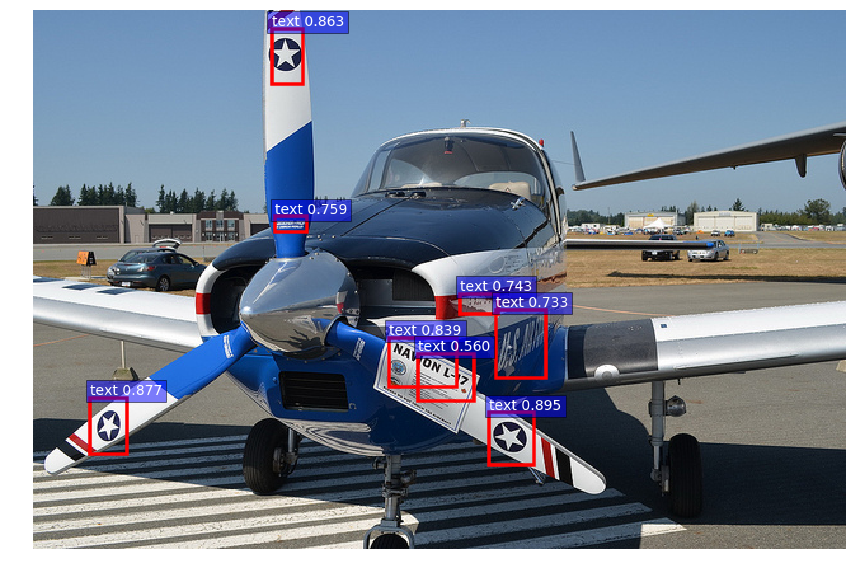

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000250.jpg
torch.Size([1, 512, 37, 50])
torch.Size([1, 3, 600, 800])
torch.Size([300, 3, 74, 74])
Detection took 0.572s for 300 object proposals


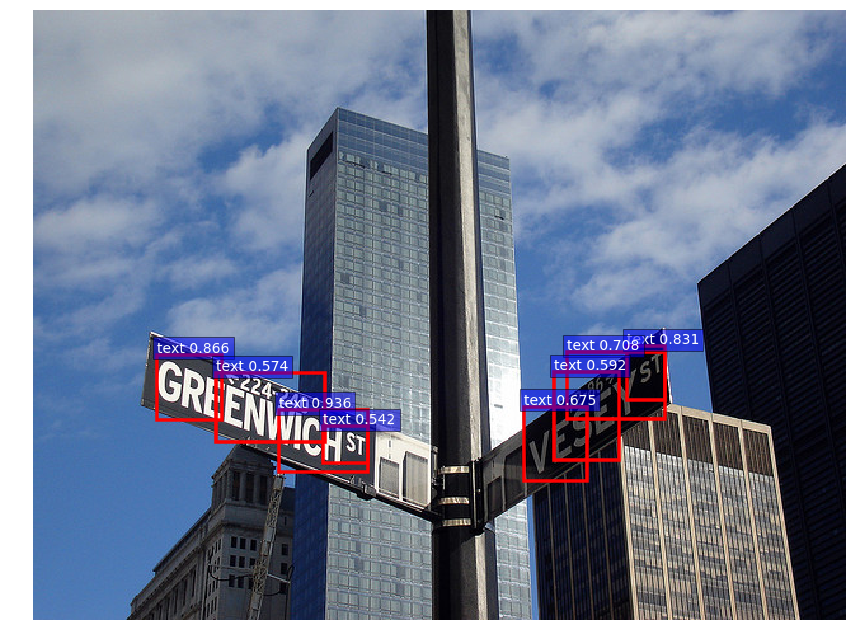

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for /izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/COCO_train2014_000000000260.jpg
torch.Size([1, 512, 37, 56])
torch.Size([1, 3, 600, 901])
torch.Size([300, 3, 74, 74])
Detection took 0.586s for 300 object proposals


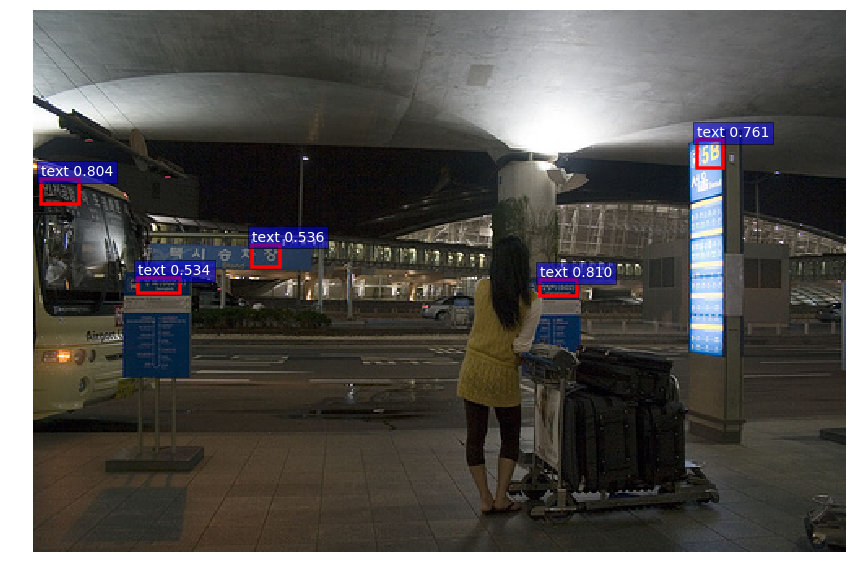

In [17]:
mypath = '/izola/xyl/pytorch-faster-rcnn/data/VOCdevkit2018/custom2018/JPEGImages/'
im_names = [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f))]
#im_names = 
for im_name in im_names[40:50]:
    print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    #print('Demo for data/demo/{}'.format(im_name))
    demo1(net, im_name, CONF_THRESH = 0.5)
    plt.show()

In [12]:
mypath = '/home/xliu/pytorch-faster-rcnn/KNOWLEDGE_FROM_CHARTS/SEMICON_BARS/'
files = [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f))]